# Measure correspondence between spatial clusters and human annotator song labels

In [1]:
import numpy as np
import pandas as pd
from pathlib import Path
import json
import seaborn as sns
import tuftelike
from matplotlib import pyplot as plt

def figsize(w,h):
    plt.rcParams['figure.figsize']=[w,h]
figsize(15,5) #for big visuals
%config InlineBackend.figure_format = 'retina'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
import seaborn as sns
palette = sns.color_palette("deep", 10)
plt.rcParams['font.family'] = 'Gill Sans'
from sklearn.metrics import pairwise_distances

from scipy.optimize import linear_sum_assignment
from collections import Counter
import numpy as np
from sklearn.cluster import DBSCAN
import warnings
import re
import ast
def parse_list_of_lists(cell):
    # Replace newline characters and convert the cell string to a list of lists
    cell = (
        re.sub(r"\s+", ",", cell.replace("\n", ""))
        .replace("[,", "[")
        .replace(",,", ",")
    )
    # cell = cell.strip(', ')
    return list(ast.literal_eval(cell))
import sys
sys.path.append('../../src/')
from visualization import inspect
import evaluation  # custom evaluation methods for hungarian matching accuracy

/Users/SML161/miniconda3/envs/opso0120/lib/python3.11/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(


In [3]:
# download the annotated dataset from EDI and set the relative or absolute path here:
annotated_dataset_path = Path("../../../localization_dataset_labeled_clips/")
song_positions = pd.read_csv(
    annotated_dataset_path / "localized_events.csv",
    index_col=0,
    parse_dates=["start_timestamp"],
)
song_positions["date"] = song_positions["start_timestamp"].apply(
    lambda x: pd.Timestamp(x).to_pydatetime().date()
)

recorder_positions = pd.read_csv(
    annotated_dataset_path / "localization_metadata/point_table.csv", index_col=0
)
song_positions["file_ids"] = song_positions["file_ids"].apply(ast.literal_eval)

audio_root = "../../localization_dataset_labeled_clips/audio"
song_positions["file"] = song_positions.copy().apply(
    lambda row: f"{audio_root}/{row['array']}/{row['folder']}/{row['file_ids'][0]}",
    axis=1,
)
song_positions["start_time"] = (10 - 3) / 2
song_positions["end_time"] = (10 + 3) / 2

In [4]:
# Convert the string representation of positions to numeric values
song_positions["position"] = (
    song_positions["position"].astype(str).str.replace(r"\bnan\b", "NaN", regex=True)
)
song_positions["position"] = song_positions["position"].apply(json.loads)
positions = np.vstack(song_positions.position.values)
song_positions["Easting"] = positions[:, 0]
song_positions["Northing"] = positions[:, 1]

In [5]:
# put test arrays last for figure
test_arrays = ("SBT-6-83", "SBT-3-7", "SBT-6-76")
arrays = list(song_positions.array.unique())
arrays = [a for a in arrays if a not in test_arrays] + list(test_arrays)

In [6]:
def hungarian_match(a, b):
    unique_a = list(dict.fromkeys(a))
    unique_b = list(dict.fromkeys(b))

    idx_a = {v: i for i, v in enumerate(unique_a)}
    idx_b = {v: i for i, v in enumerate(unique_b)}

    cost = np.zeros((len(unique_a), len(unique_b)))
    for va, vb in zip(a, b):
        cost[idx_a[va], idx_b[vb]] += 1

    row_ind, col_ind = linear_sum_assignment(cost, maximize=True)

    mapping = {v: None for v in unique_a}
    mapping.update({unique_a[r]: unique_b[c] for r, c in zip(row_ind, col_ind)})
    return mapping

In [11]:
warnings.filterwarnings("ignore", message="The palette list has more values")

# use pallette with #ccc as first color for -1 class
palette = sns.color_palette("deep", 10)
palette = [(0.8, 0.8, 0.8)] + palette  # add light gray for noise points

eps = 40
song_positions["spatial_cluster"] = np.nan
next_cluster_id = 0
for i, (array, array_dets) in enumerate(song_positions.groupby("array")):
    # cluster the detections
    clustering = DBSCAN(eps=eps, min_samples=5).fit(array_dets[["Easting", "Northing"]])
    array_dets["spatial_cluster"] = (clustering.labels_).astype(int)
    # global labels: don't repeat cluster IDs across arrays, but keep noise points as -1
    global_labels = [l + next_cluster_id if l != -1 else -1 for l in clustering.labels_]
    song_positions.loc[array_dets.index, "spatial_cluster"] = global_labels
    next_cluster_id = max(song_positions["spatial_cluster"].dropna()) + 1

# use bipartite matching to match spatial clusters and annotator ID's
no_noise = song_positions[song_positions["spatial_cluster"] != -1]
spatial_to_annotator_mapping = hungarian_match(
    no_noise["spatial_cluster"], no_noise["class"]
)
annotator_to_spatial_mapping = {v: k for k, v in spatial_to_annotator_mapping.items()}
song_positions["song_class_mapped"] = song_positions["class"].map(
    annotator_to_spatial_mapping
)

In [12]:
disagreements = song_positions[
    song_positions["song_class_mapped"] != song_positions["spatial_cluster"]
]
agreements = song_positions[~song_positions.index.isin(disagreements.index)]
# could drop points that were not assigned to a spatial cluster (i.e. noise points with spatial_cluster = -1)
# disagreements = disagreements[disagreements['spatial_cluster']!=-1]
print(
    f"fraction of disagreements or unassigned points: {len(disagreements)/len(song_positions):.2f}"
)

fraction of disagreements or unassigned points: 0.15


In [13]:
song_positions.shape

(717, 26)

Plot maps of songs colored by song-based label and spatial cluster label, side-by-side

/var/folders/d8/265wdp1n0bn_r85dh3pp95fh0000gq/T/ipykernel_6084/1446677460.py:142: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


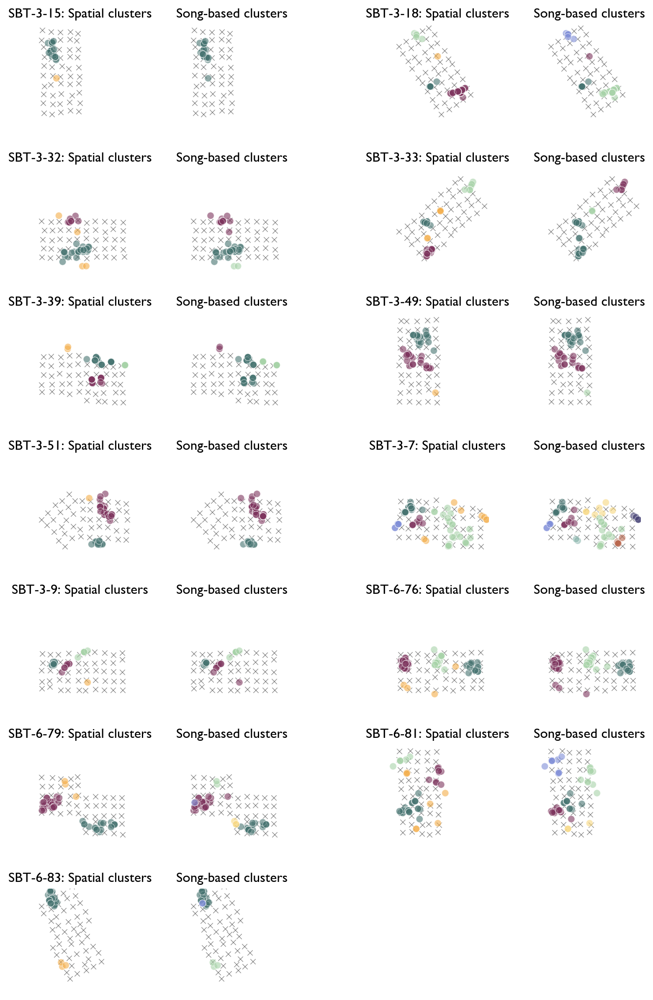

In [17]:
# fig, axs = plt.subplots(13, 2, figsize=(6, 30))
# axs = axs.flatten()

from matplotlib.gridspec import GridSpec

palette = [
    "#f4ae4a",
    "#477471",
    "#7e355e",
    "#a8d3a9",
    "#808fd8",
    "#f7d77f",
    "#8bb7ae",
    "#b8654b",
    "#3e3a70",
    "#d4e5a5",
    "#637f58",
    "#abd6d1",
    "#8177ac",
    "#f4b9a8",
    "#a16385",
    "#f2e1ac",
    "#696a8c",
]

sns.set_palette(palette)

fig = plt.figure(figsize=(10, 15))
gs = GridSpec(
    7,
    5,
    figure=fig,
    width_ratios=[1, 1, 0.3, 1, 1],  # column 2 is the spacer
    wspace=0.1,
    hspace=0.4,
)  #

axs = []
for row in range(7):
    for col in [0, 1, 3, 4]:  # skip spacer column 2
        axs.append(fig.add_subplot(gs[row, col]))

# plt.subplots_adjust(hspace=0.4)


for i, (array, array_dets) in enumerate(song_positions.groupby("array")):
    # array_dets = song_positions[song_positions["array"] == array]#.copy()
    # sort by spatial cluster for better plotting
    array_dets = array_dets.sort_values("spatial_cluster")

    # create relative coordinates for plotting
    array_metadata = recorder_positions[recorder_positions["array"] == array].copy()
    array_metadata["x"] = (
        array_metadata["utm_easting"] - array_metadata["utm_easting"].min()
    )
    array_metadata["y"] = (
        array_metadata["utm_northing"] - array_metadata["utm_northing"].min()
    )

    array_dets["x"] = array_dets["Easting"] - array_metadata["utm_easting"].min()
    array_dets["y"] = array_dets["Northing"] - array_metadata["utm_northing"].min()

    # plot array microphones
    ax = axs[2 * i]
    ax.scatter(
        array_metadata.x,
        array_metadata.y,
        marker="x",
        s=20,
        color="#888888",
        linewidths=0.5,
    )
    # plot localized detections of Ovenbird songs, colored by individual bird label
    sns.scatterplot(
        data=array_dets,
        x="x",
        y="y",
        hue="spatial_cluster",
        ax=ax,
        alpha=0.6,
        palette=palette,
    )

    xmin, xmax = -50, 350
    ymin, ymax = -50, 350
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

    ax.set_xticks([0, 100, 200, 300])
    ax.set_yticks([0, 100, 200, 300])

    tuftelike._remove_chart_junk([0, 300], [0, 300], ax)
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    ax.legend().remove()
    ax.set_title(f"{array}: Spatial clusters")

    # second plot: plot the same points but colored by annotated individual ID for comparison
    # now sort by mapped class for aligned coloration, but still plot original song labels
    array_dets = array_dets.sort_values("song_class_mapped")

    ax = axs[2 * i + 1]
    ax.scatter(
        array_metadata.x,
        array_metadata.y,
        marker="x",
        s=20,
        color="#888888",
        linewidths=0.5,
    )
    # plot localized detections of Ovenbird songs, colored by individual bird label
    sns.scatterplot(
        data=array_dets,
        x="x",
        y="y",
        hue="class",
        ax=ax,
        alpha=0.6,
        palette=palette[1:],
    )

    xmin, xmax = -50, 350
    ymin, ymax = -50, 350
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

    ax.set_xticks([0, 100, 200, 300])
    ax.set_yticks([0, 100, 200, 300])

    tuftelike._remove_chart_junk([0, 300], [0, 300], ax)
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    ax.legend().remove()
    ax.set_title(f"Song-based clusters")


# if len(axs) > len(song_positions.array.unique()):
for ax in axs:  # [len(song_positions.array.unique()) * 2 :]:
    ax.axis("off")
    # equal aspect ratio
    ax.set_aspect("equal")
plt.tight_layout()
plt.savefig("../../figures/spatial_vs_song_label_maps.pdf")

Calculate: number of songs per spatial cluster, as histogram and as proportion of clusters with > 1 song

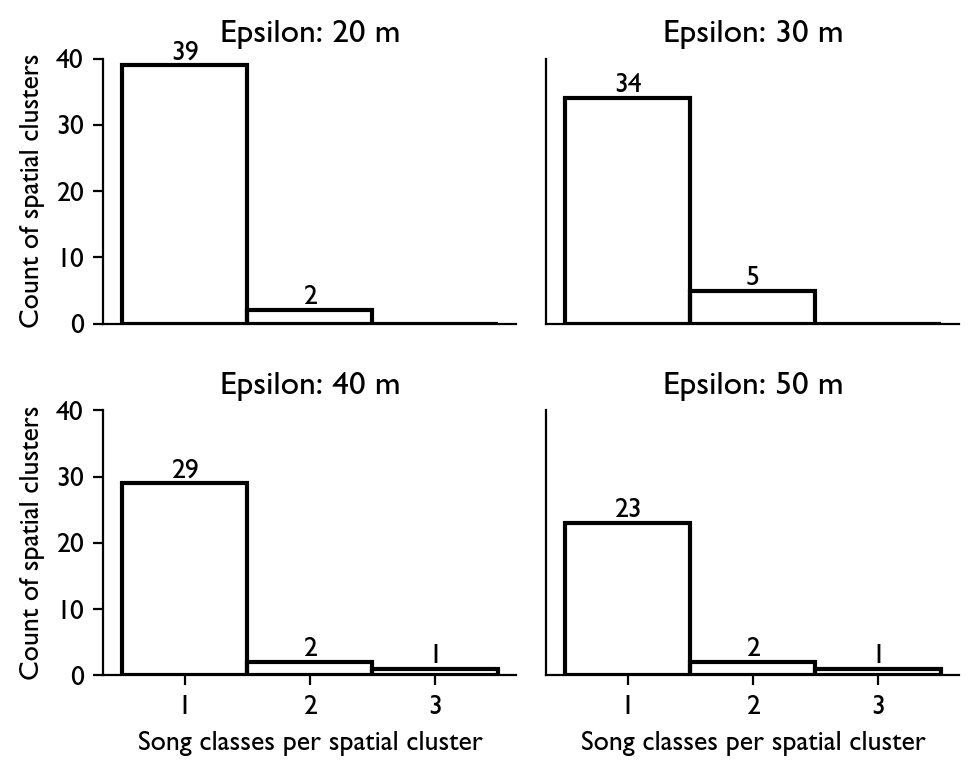

In [18]:
# number of 'ovenbird_cluster_labels' per 'spatial_cluster'
fig, axs = plt.subplots(2, 2, figsize=(5, 4))
axs = axs.flatten()

import seaborn as sns

import warnings

warnings.filterwarnings("ignore", message="to make it possible to propagate the")

for j, eps in enumerate([20, 30, 40, 50]):
    song_positions["spatial_cluster"] = np.nan
    next_cluster_id = 0
    for i, (array, array_dets) in enumerate(song_positions.groupby("array")):
        # cluster the detections
        clustering = DBSCAN(eps=eps, min_samples=5).fit(
            array_dets[["Easting", "Northing"]]
        )
        array_dets["spatial_cluster"] = (clustering.labels_).astype(int)
        # global labels: don't repeat cluster IDs across arrays, but keep noise points as -1
        global_labels = [
            l + next_cluster_id if l != -1 else -1 for l in clustering.labels_
        ]
        song_positions.loc[array_dets.index, "spatial_cluster"] = global_labels
        next_cluster_id = max(song_positions["spatial_cluster"].dropna()) + 1

    # use bipartite matching to match spatial clusters and annotator ID's
    no_noise = song_positions[song_positions["spatial_cluster"] != -1]
    spatial_to_annotator_mapping = hungarian_match(
        no_noise["spatial_cluster"], no_noise["class"]
    )
    annotator_to_spatial_mapping = {
        v: k for k, v in spatial_to_annotator_mapping.items()
    }
    song_positions["song_class_mapped"] = song_positions["class"].map(
        annotator_to_spatial_mapping
    )
    n_songtypes_per_cluster = song_positions.groupby("spatial_cluster")[
        "song_class_mapped"
    ].nunique()
    n_songtypes_per_cluster = n_songtypes_per_cluster[
        n_songtypes_per_cluster.index != -1
    ]  # exclude noise points
    # no fill, just black lines
    sns.histplot(
        n_songtypes_per_cluster,
        bins=np.arange(0.5, 3 + 1.5, 1),
        ax=axs[j],
        color="black",
        fill=False,
    )
    axs[j].set_title(f"Epsilon: {eps} m")
    axs[j].set_ylim(0, 40)
    sns.despine()
    axs[j].set_xlabel("Song classes per spatial cluster")
    axs[j].set_ylabel("Count of spatial clusters")
    # x ticks: 1,2,3,4
    axs[j].set_xticks([1, 2, 3])
    # only show y axis on leftmost plots
    if j % 2 == 1:
        axs[j].set_ylabel("")
        axs[j].set_yticks([])
    # only show x axis on bottom plots
    if j < 2:
        axs[j].set_xlabel("")
        axs[j].set_xticks([])
    # add numbers on top of bars
    for p in axs[j].patches:
        if p.get_height() > 0:
            axs[j].annotate(
                int(p.get_height()),
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha="center",
                va="bottom",
            )
plt.tight_layout()
plt.savefig("../../figures/spatial_cluster_song_class_diversity.pdf")

In [19]:
subset = song_positions[song_positions["array"] == "SBT-3-33"]
centers = subset.groupby("spatial_cluster")[["Easting", "Northing"]].mean()
centers - subset[["Easting", "Northing"]].min()
# subset.groupby("spatial_cluster")["class"].value_counts()

,Easting,Northing
spatial_cluster,,
-1.0,65.172200,176.956495
5.0,8.693118,130.028135
6.0,21.023345,22.079504
7.0,181.818860,270.698662


assess clustering agreement between spatial and human acoustic-based cluster labels

In [79]:
# repeated trials for eps = 20, 30, 40 m
scores = []
eps_values = [20, 30, 40, 50]

for eps in eps_values:
    # for _ in range(50):
    song_positions["spatial_cluster"] = np.nan
    next_cluster_id = 0
    for i, (array, array_dets) in enumerate(song_positions.groupby("array")):
        # cluster the detections
        clustering = DBSCAN(eps=eps, min_samples=5).fit(
            array_dets[["Easting", "Northing"]]
        )
        array_dets["spatial_cluster"] = clustering.labels_
        # global labels: don't repeat cluster IDs across arrays, but keep noise points as -1
        global_labels = [
            l + next_cluster_id if l != -1 else -1 for l in clustering.labels_
        ]
        song_positions.loc[array_dets.index, "spatial_cluster"] = global_labels
        next_cluster_id = max(song_positions["spatial_cluster"].dropna()) + 1

    # first, filter to only evaluate on songs that were assigned to a spatial cluster (i.e. not noise points)
    spatially_clustered_songs = song_positions[
        ~song_positions["spatial_cluster"].isna()
    ]
    #
    acc = evaluation.bipartite_hungarian_matching_accuracy(
        spatially_clustered_songs["spatial_cluster"],
        spatially_clustered_songs["class"],
    )

    # calculate diameter as largest pairwise point distance
    diameters = []
    for cluster, positions in song_positions.groupby("spatial_cluster"):
        if cluster == -1:
            continue
        pdist = pairwise_distances(positions[["Easting", "Northing"]])
        diameters.append(pdist.max())
    scores.append(
        {
            "eps": eps,
            "accuracy": acc,
            "diameter_median": np.median(diameters),
            "diameter_mean": np.mean(diameters),
            "n_clusters": spatially_clustered_songs["spatial_cluster"].nunique(),
        }
    )

score_df = pd.DataFrame(scores)


score_df_out = score_df.copy()
score_df_out.columns = [
    "HDBSCAN epsilon (m)",
    "Song vs Spatial Matching accuracy",
    "Median diameter (m)",
    "Mean diameter (m)",
    "Number of spatial clusters",
]
# score_df.set_index('HDBSCAN epsilon (m)', inplace=True)

score_df_out["Median diameter (m)"] = score_df_out["Median diameter (m)"].astype(int)
score_df_out["Mean diameter (m)"] = score_df_out["Mean diameter (m)"].astype(int)
score_df_out["Song vs Spatial Matching accuracy"] = score_df_out[
    "Song vs Spatial Matching accuracy"
].round(2)

score_df_out.round(2).to_csv(
    "../../results/spatial_vs_annotator_correspondence.csv", index=False
)

In [85]:
score_df

,eps,accuracy,diameter_median,diameter_mean,n_clusters
0,20,0.716876,27.837980,30.055503,42
1,30,0.821478,41.604255,42.830348,40
2,40,0.859135,57.130803,65.672331,33
3,50,0.775453,78.962100,88.998405,27


Review songs in spatial cluster 5 vs 6, which are the distinctive spatial clusters that were labeled as the same individual:

Spectrograms appear identical, suggesting that both spatial clusters could belong to the same bird. 



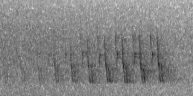
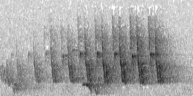
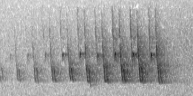
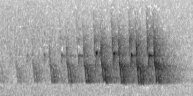
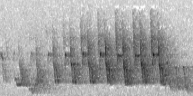
...
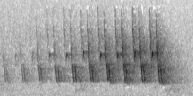
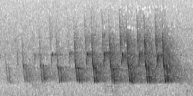
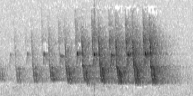
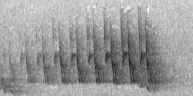
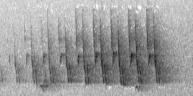

In [ ]:
_ = inspect(
    song_positions[song_positions["spatial_cluster"] == 5], bandpass_range=(2000, 10000)
)


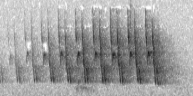
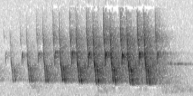
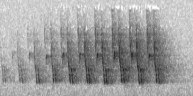
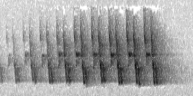
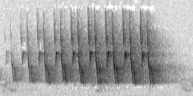
...
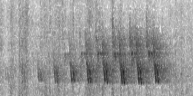
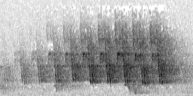
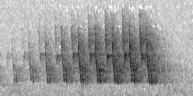
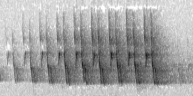
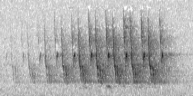

In [ ]:
_ = inspect(
    song_positions[song_positions["spatial_cluster"] == 6], bandpass_range=(2000, 10000)
)

# map only disagreements

/var/folders/d8/265wdp1n0bn_r85dh3pp95fh0000gq/T/ipykernel_53067/2735655059.py:121: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


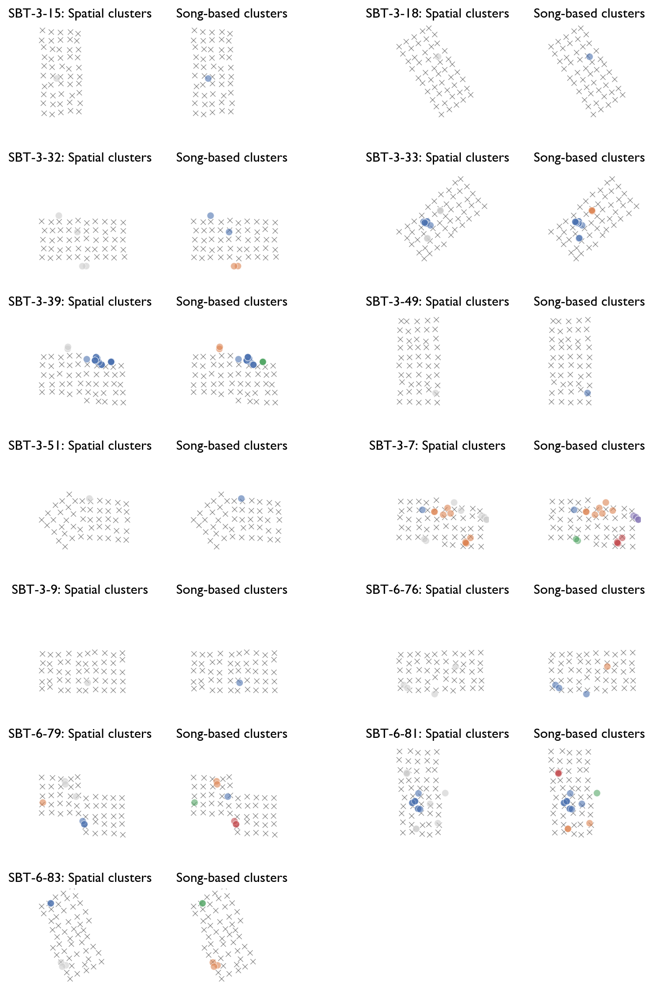

In [30]:
# fig, axs = plt.subplots(13, 2, figsize=(6, 30))
# axs = axs.flatten()

from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(10, 15))
gs = GridSpec(
    7,
    5,
    figure=fig,
    width_ratios=[1, 1, 0.3, 1, 1],  # column 2 is the spacer
    wspace=0.1,
    hspace=0.4,
)  #

axs = []
for row in range(7):
    for col in [0, 1, 3, 4]:  # skip spacer column 2
        axs.append(fig.add_subplot(gs[row, col]))

# plt.subplots_adjust(hspace=0.4)


for i, (array, array_dets) in enumerate(disagreements.groupby("array")):
    # array_dets = song_positions[song_positions["array"] == array]#.copy()
    # sort by spatial cluster for better plotting
    array_dets = array_dets.sort_values("spatial_cluster")

    # create relative coordinates for plotting
    array_metadata = recorder_positions[recorder_positions["array"] == array].copy()
    array_metadata["x"] = (
        array_metadata["utm_easting"] - array_metadata["utm_easting"].min()
    )
    array_metadata["y"] = (
        array_metadata["utm_northing"] - array_metadata["utm_northing"].min()
    )

    array_dets["x"] = array_dets["Easting"] - array_metadata["utm_easting"].min()
    array_dets["y"] = array_dets["Northing"] - array_metadata["utm_northing"].min()

    # plot array microphones
    ax = axs[2 * i]
    ax.scatter(
        array_metadata.x,
        array_metadata.y,
        marker="x",
        s=20,
        color="#888888",
        linewidths=0.5,
    )
    # plot localized detections of Ovenbird songs, colored by spatial cluster label
    p = palette if -1 in array_dets["spatial_cluster"].unique() else palette[1:]
    sns.scatterplot(
        data=array_dets,
        x="x",
        y="y",
        hue="spatial_cluster",
        ax=ax,
        alpha=0.6,
        palette=p,  # no longer has noise points -1
    )

    xmin, xmax = -50, 350
    ymin, ymax = -50, 350
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

    ax.set_xticks([0, 100, 200, 300])
    ax.set_yticks([0, 100, 200, 300])

    tuftelike._remove_chart_junk([0, 300], [0, 300], ax)
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    ax.legend().remove()
    ax.set_title(f"{array}: Spatial clusters")

    # second plot: plot the same points but colored by annotated individual ID for comparison
    # now sort by mapped class for aligned coloration, but still plot original song labels
    array_dets = array_dets.sort_values("song_class_mapped")

    ax = axs[2 * i + 1]
    ax.scatter(
        array_metadata.x,
        array_metadata.y,
        marker="x",
        s=20,
        color="#888888",
        linewidths=0.5,
    )
    # plot localized detections of Ovenbird songs, colored by individual bird label
    sns.scatterplot(
        data=array_dets,
        x="x",
        y="y",
        hue="class",
        ax=ax,
        alpha=0.6,
        palette=palette[1:],
    )

    xmin, xmax = -50, 350
    ymin, ymax = -50, 350
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

    ax.set_xticks([0, 100, 200, 300])
    ax.set_yticks([0, 100, 200, 300])

    tuftelike._remove_chart_junk([0, 300], [0, 300], ax)
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    ax.legend().remove()
    ax.set_title(f"Song-based clusters")


# if len(axs) > len(song_positions.array.unique()):
for ax in axs:  # [len(song_positions.array.unique()) * 2 :]:
    ax.axis("off")
    # equal aspect ratio
    ax.set_aspect("equal")
plt.tight_layout()
# plt.savefig("../../figures/spatial_vs_song_label_maps.pdf")

In [54]:
from opensoundscape import Spectrogram, Audio
from IPython.display import clear_output

Class: 45


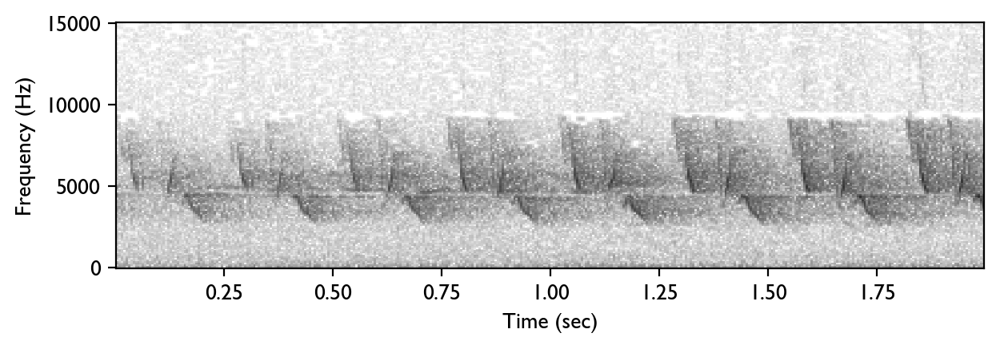

SBT-6-83_oven_0026
Song label: 45   Spatial: 31.0


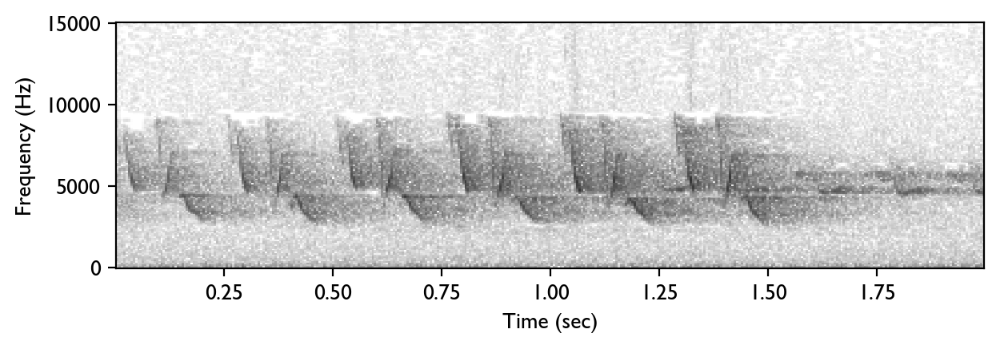

SBT-6-83_oven_0027
Song label: 45   Spatial: 31.0
=====Examples of agreement for class 45 and spatial cluster 31.0:====


In [66]:
figsize(7, 2)
for label, subset in disagreements.groupby("class"):
    print(f"Class: {label}")
    for i, row in subset.iterrows():
        a = Audio.from_file(row["file"], offset=4, duration=2)
        Spectrogram.from_audio(a).bandpass(0, 15000).plot(range=(-90, -10))
        print(f"{row.name}")
        print(f"Song label: {row['class']}   Spatial: {row['spatial_cluster']}")
    # now print some examples of non-disagreement samples from the same class for comparison
    agreements_subset = agreements[(agreements["class"] == label)]
    print(
        f"=====Examples of agreement for class {label} and spatial cluster {row['spatial_cluster']}:===="
    )
    for i, row in agreements_subset.sample(min(4, len(agreements_subset))).iterrows():
        a = Audio.from_file(row["file"], offset=4, duration=2)
        Spectrogram.from_audio(a).bandpass(0, 15000).plot(range=(-90, -10))
        print(f"{row.name}")
        print(f"Song label: {row['class']}   Spatial: {row['spatial_cluster']}")
    if input("x to break") == "x":
        break
    clear_output(wait=True)

In [69]:
len(song_positions.index.unique())

717

# Observed vs simulated pairwise distances between songs

In [ ]:
pairwise_distances_diff_obs = []
pairwise_distances_same_obs = []
for array in arrays:
    array_song_positions = song_positions[song_positions.array == array]

    # pot histogram of pairwise distances for between-class vs within-class pairs
    classes = array_song_positions["class"].unique()

    for i in range(len(array_song_positions)):
        for j in range(i + 1, len(array_song_positions)):
            pos_i = array_song_positions.iloc[i][["Easting", "Northing"]].values
            pos_j = array_song_positions.iloc[j][["Easting", "Northing"]].values
            distance = np.linalg.norm(pos_i - pos_j)
            if (
                array_song_positions.iloc[i]["class"]
                == array_song_positions.iloc[j]["class"]
            ):
                pairwise_distances_same_obs.append(distance)
            else:
                pairwise_distances_diff_obs.append(distance)

Expected distances under circular territories

In [ ]:
import numpy as np
import random
from math import sqrt, ceil


def poisson_disk_sampling(width, height, r, k=30):
    """
    Bridson, Robert. "Fast Poisson disk sampling in arbitrary dimensions." SIGGRAPH sketches 10.1 (2007): 1.

    https://www.cs.ubc.ca/~rbridson/docs/bridson-siggraph07-poissondisk.pdf

    width, height: domain size
    r: minimum distance between points
    k: attempts per active point
    """
    cell_size = r / sqrt(2)
    grid_width = int(ceil(width / cell_size))
    grid_height = int(ceil(height / cell_size))

    grid = [[None for _ in range(grid_height)] for _ in range(grid_width)]

    def grid_coords(p):
        return int(p[0] // cell_size), int(p[1] // cell_size)

    def in_bounds(p):
        return 0 <= p[0] < width and 0 <= p[1] < height

    def fits(p):
        gx, gy = grid_coords(p)
        for i in range(max(gx - 2, 0), min(gx + 3, grid_width)):
            for j in range(max(gy - 2, 0), min(gy + 3, grid_height)):
                neighbor = grid[i][j]
                if neighbor is not None:
                    if np.linalg.norm(np.array(p) - np.array(neighbor)) < r:
                        return False
        return True

    # Initialize
    p0 = (random.uniform(0, width), random.uniform(0, height))
    active = [p0]
    samples = [p0]

    gx, gy = grid_coords(p0)
    grid[gx][gy] = p0

    while active:
        idx = random.randint(0, len(active) - 1)
        base_point = active[idx]
        found = False

        for _ in range(k):
            theta = random.uniform(0, 2 * np.pi)
            radius = random.uniform(r, 2 * r)
            new_point = (
                base_point[0] + radius * np.cos(theta),
                base_point[1] + radius * np.sin(theta),
            )

            if in_bounds(new_point) and fits(new_point):
                samples.append(new_point)
                active.append(new_point)
                gx, gy = grid_coords(new_point)
                grid[gx][gy] = new_point
                found = True

        if not found:
            active.pop(idx)

    return np.array(samples)

In [ ]:
# simulate positions in circular territories with typical Ovenbird spacing
# Smith and Shugart (1987) found that Ovenbird territories have area 1300-3800 m^2 approx uniform distribution
#
area_range = (1300, 3800)  # m^2, r=36-61m
# buffer zone 60-100ft in Stenger 1959, which is 18-30m
# Mezzarole 2004 found foraging territory overla is 15-65%
# and density .25-1.25 territoires/Ha

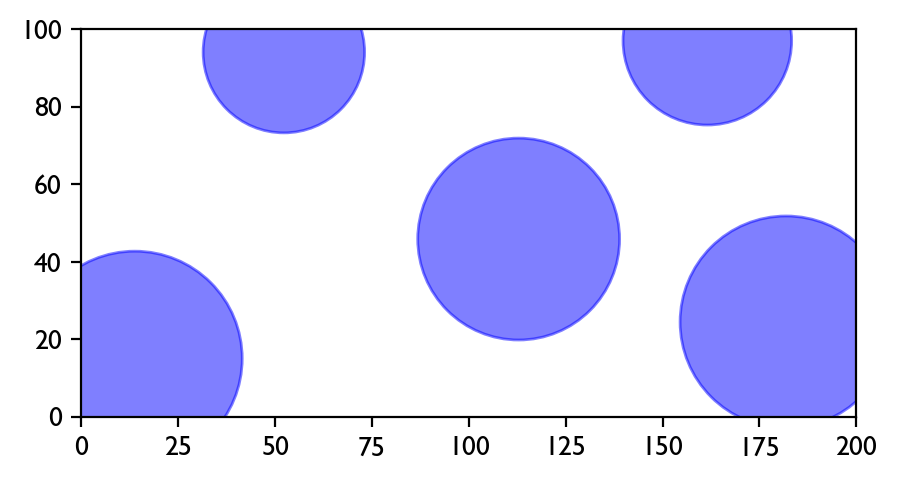

In [ ]:
points = poisson_disk_sampling(width=200, height=100, r=60)
areas = np.random.uniform(*area_range, size=len(points))
radii = np.sqrt(areas / np.pi)

# visualize
import matplotlib.pyplot as plt

# plot circles with centers at points and radius radii
fig, ax = plt.subplots(figsize=(5, 5))
for (x, y), r in zip(points, radii):
    circle = plt.Circle((x, y), r, color="blue", alpha=0.5)
    ax.add_artist(circle)
ax.set_xlim(0, 200)
ax.set_ylim(0, 100)
ax.set_aspect("equal")

In [ ]:
sim_pairwise_distances_same_sim = []
sim_pairwise_distances_diff_sim = []
# simulate 30 times:
for _ in range(30):
    # now for each bird, simulate 50 random points within its territory
    simulated_points = []
    for (x, y), r in zip(points, radii):
        for _ in range(50):
            # generate a random point within the circle
            theta = np.random.uniform(0, 2 * np.pi)
            distance = np.random.uniform(0, r)
            px = x + distance * np.cos(theta)
            py = y + distance * np.sin(theta)
            simulated_points.append((px, py))
    simulated_points = np.array(simulated_points)
    # compute in-individual vs between-individual pairwise distances

    for i in range(len(simulated_points)):
        for j in range(i + 1, len(simulated_points)):
            pos_i = simulated_points[i]
            pos_j = simulated_points[j]
            distance = np.linalg.norm(pos_i - pos_j)
            if np.linalg.norm(points[i // 50] - points[j // 50]) < 1e-5:  # same bird
                sim_pairwise_distances_same_sim.append(distance)
            else:
                sim_pairwise_distances_diff_sim.append(distance)

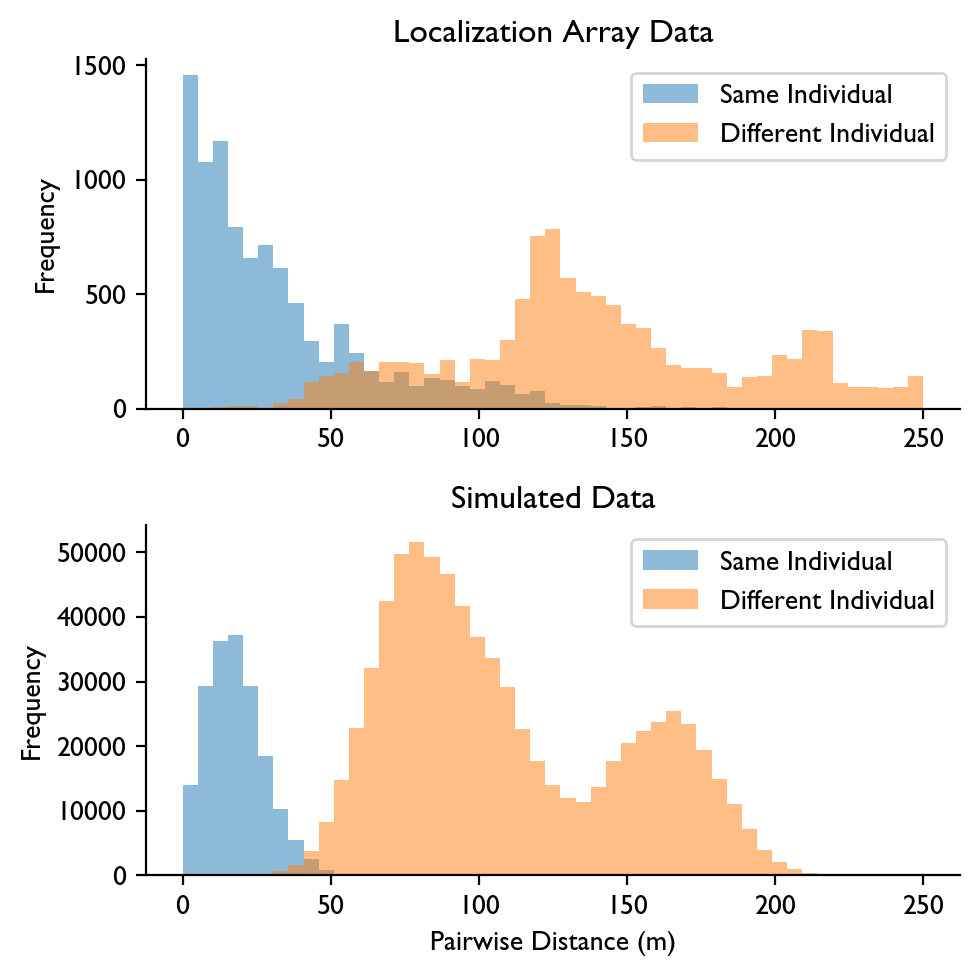

In [ ]:
fig, axs = plt.subplots(2, 1, figsize=(5, 5))
# first plot the data, then the simulation
axs[0].hist(
    pairwise_distances_same_obs,
    bins=np.linspace(0, 250, 50),
    alpha=0.5,
    label="Same Individual",
)
axs[0].hist(
    pairwise_distances_diff_obs,
    bins=np.linspace(0, 250, 50),
    alpha=0.5,
    label="Different Individual",
)
axs[0].set_title("Localization Array Data")
axs[1].hist(
    sim_pairwise_distances_same_sim,
    bins=np.linspace(0, 250, 50),
    alpha=0.5,
    label="Same Individual",
)
axs[1].hist(
    sim_pairwise_distances_diff_sim,
    bins=np.linspace(0, 250, 50),
    alpha=0.5,
    label="Different Individual",
)
axs[1].set_title("Simulated Data")
for ax in axs:
    ax.set_xlabel("Pairwise Distance (m)")
    ax.set_ylabel("Frequency")
    ax.legend()
sns.despine()
# remove x tick labels and axis labels from the top plot
# axs[0].set_xticks([])
axs[0].set_xlabel("")
plt.tight_layout()
plt.savefig("../../figures/pairwise_distance_histograms.pdf")